# Analyse sur les données Hydroswot - Projet tuteuré - 2021

Ensemble des variables présentes dans le jeu de données:

site_no: site number (int), source HYDRoSWOT data

station_name: station name (str), source HYDRoSWOT data

river: River name (str) extracted from station_name, source HYDRoSWOT data

stream type: Type of stream (str) extracted from station_name, source HYDRoSWOT data

lon: longitude (float, deg), source HYDRoSWOT data

lat: latitude (float, deg), source HYDRoSWOT data

flowacc: flow accumulation (float, km2), i.e. size of the upstream watershed, source MERIT-Hydro

stage: stage (float, m), source HYDRoSWOT data

W: free surface top width (float, m), source HYDRoSWOT data

dH: water depth above unobserved flow (float, m), source HYDRoSWOT data

dA: cross-sectional flow area above A0 (float, m2), source HYDRoSWOT data

U: flow velocity (float, m/s), source HYDRoSWOT data

A0: minimal (unobserved) flow area (float, m2), source HYDRoSWOT data

Abar: mean flow area (float, m2), source HYDRoSWOT data

Amed: median flow area (float, m2), source HYDRoSWOT data

Sdem: terrain slope (m/m) computed from MERIT Digital Elevation Model, source MERIT-Basins

clay: percentage of clay in the floodplain (float, %), source ISRIC SoilGrids

sand: percentage of sand in the floodplain (float, %), source ISRIC SoilGrids

silt: percentage of sile in the floodplain (float, %), source ISRIC SoilGrids

PA: mean annual precipitation (float, mm), source WORLDCLIM 1.4 Bio data

TA: mean annual temperature (float, °C), source WORLDCLIM 1.4 Bio data

LC1: Evergreen/Deciduous Needleleaf Trees (float, %), source Global 1-km Consensus Land Cover

LC2: Evergreen Broadleaf Trees (float, %), source Global 1-km Consensus Land Cover

LC3: Deciduous Broadleaf Trees (float, %), source Global 1-km Consensus Land Cover

LC4: Mixed/Other Trees (float, %), source Global 1-km Consensus Land Cover

LC5: Shrubs (float, %), source Global 1-km Consensus Land Cover

LC6: Herbaceous Vegetation (float, %), source Global 1-km Consensus Land Cover

LC7: Cultivated and Managed Vegetation (float, %), source Global 1-km Consensus Land Cover

LC8: Regularly Flooded Vegetation (float, %), source Global 1-km Consensus Land Cover

LC9: Urban/Built-up (float, %), source Global 1-km Consensus Land Cover

LC10: Snow/Ice (float, %), source Global 1-km Consensus Land Cover

LC11: Barren (float, %), source Global 1-km Consensus Land Cover

LC12: Open Water (float, %), source Global 1-km Consensus Land Cover

Q5_GSCD: 5-th base streamflow (float, mm/d), source Global StreamFlow Characteristics Database (Beck, 
2015)

Q10_GSCD: 10-th base streamflow (float, mm/d), source Global StreamFlow Characteristics Database (Beck, 2015)

Q20_GSCD: 20-th base streamflow (float, mm/d), source Global StreamFlow Characteristics Database (Beck, 2015)

QMEAN_GSCD: mean discharge quantile (float, ??), source Global StreamFlow Characteristics Database (Beck, 2015)

Q80_GSCD: 80-th base streamflow (float, mm/d), source Global StreamFlow Characteristics Database (Beck, 2015)

Q90_GSCD: 90-th base streamflow (float, mm/d), source Global StreamFlow Characteristics Database (Beck, 2015)

Q95_GSCD: 95-th base streamflow (float, mm/d), source Global StreamFlow Characteristics Database (Beck, 2015)

Q: discharge (float, m3/s), source HYDRoSWOT data

## Importation des librairies nécessaires et du jeu de données

In [1]:
import numpy as np
from math import sqrt, log
import pandas as pd
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import matplotlib
import sklearn.cluster as sclust
from scipy import cluster
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.cluster import KMeans
import numpy as np
import random
import seaborn as sns
from sklearn.preprocessing import scale
%matplotlib inline

In [2]:
data = pd.read_csv("../databases/HYDROSWOT_100m_v3.csv", sep=";")
data

C:\Users\Responsable\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,site_no,station_name,riverEspace,river,riverOrigin,stream_type,lon,lat,flowacc,stage,...,LC11,LC12,Q5_GSCD,Q10_GSCD,Q20_GSCD,QMEAN_GSCD,Q80_GSCD,Q90_GSCD,Q95_GSCD,Q
0,2419890,TALLAPOOSA RIVER NEAR MONT.-MONT. WATER WORKS,TALLAPOOSA,TALLAPOOSA,TALLAPOOSA,river,-86.19,32.43,12033.084713,1.527048,...,0.0,0.0,46314.126839,27537.165438,16147.596327,5.236103e+06,2545.144341,1831.073927,1303.980932,76.172317
1,2419890,TALLAPOOSA RIVER NEAR MONT.-MONT. WATER WORKS,TALLAPOOSA,TALLAPOOSA,TALLAPOOSA,river,-86.19,32.43,12033.084713,8.909304,...,0.0,0.0,46314.126839,27537.165438,16147.596327,5.236103e+06,2545.144341,1831.073927,1303.980932,1486.634446
2,2419890,TALLAPOOSA RIVER NEAR MONT.-MONT. WATER WORKS,TALLAPOOSA,TALLAPOOSA,TALLAPOOSA,river,-86.19,32.43,12033.084713,1.271016,...,0.0,0.0,46314.126839,27537.165438,16147.596327,5.236103e+06,2545.144341,1831.073927,1303.980932,46.156460
3,2419890,TALLAPOOSA RIVER NEAR MONT.-MONT. WATER WORKS,TALLAPOOSA,TALLAPOOSA,TALLAPOOSA,river,-86.19,32.43,12033.084713,2.752344,...,0.0,0.0,46314.126839,27537.165438,16147.596327,5.236103e+06,2545.144341,1831.073927,1303.980932,150.645624
4,2419890,TALLAPOOSA RIVER NEAR MONT.-MONT. WATER WORKS,TALLAPOOSA,TALLAPOOSA,TALLAPOOSA,river,-86.19,32.43,12033.084713,2.173224,...,0.0,0.0,46314.126839,27537.165438,16147.596327,5.236103e+06,2545.144341,1831.073927,1303.980932,140.168391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16632,5583000,"SANGAMON RIVER NEAR OAKFORD, IL",SANGAMON,SANGAMON,SANGAMON,river,-89.98,40.12,13190.809393,1.914144,...,0.0,0.0,37365.132564,17207.727290,7672.051917,3.360749e+06,213.575659,53.556619,72.786329,78.720834
16633,5583000,"SANGAMON RIVER NEAR OAKFORD, IL",SANGAMON,SANGAMON,SANGAMON,river,-89.98,40.12,13190.809393,4.212336,...,0.0,0.0,37365.132564,17207.727290,7672.051917,3.360749e+06,213.575659,53.556619,72.786329,396.435852
16634,5583000,"SANGAMON RIVER NEAR OAKFORD, IL",SANGAMON,SANGAMON,SANGAMON,river,-89.98,40.12,13190.809393,1.423416,...,0.0,0.0,37365.132564,17207.727290,7672.051917,3.360749e+06,213.575659,53.556619,72.786329,32.564374
16635,5583000,"SANGAMON RIVER NEAR OAKFORD, IL",SANGAMON,SANGAMON,SANGAMON,river,-89.98,40.12,13190.809393,2.849880,...,0.0,0.0,37365.132564,17207.727290,7672.051917,3.360749e+06,213.575659,53.556619,72.786329,190.572378


In [3]:
data.columns

Index(['site_no', 'station_name', 'riverEspace', 'river', 'riverOrigin',
       'stream_type', 'lon', 'lat', 'flowacc', 'stage', 'W', 'dH', 'dA', 'U',
       'A0', 'Abar', 'Amed', 'Sdem', 'clay', 'sand', 'silt', 'PA', 'TA', 'LC1',
       'LC2', 'LC3', 'LC4', 'LC5', 'LC6', 'LC7', 'LC8', 'LC9', 'LC10', 'LC11',
       'LC12', 'Q5_GSCD', 'Q10_GSCD', 'Q20_GSCD', 'QMEAN_GSCD', 'Q80_GSCD',
       'Q90_GSCD', 'Q95_GSCD', 'Q'],
      dtype='object')

In [4]:
data.columns[0]

'site_no'

## Préparation du jeu de données et stats descriptives

Dans un premier temps nous allons nous débarasser des variables "répétitives" ou peu signifiantes. c'est le cas des variables stream_type et station_name qui n'apporte pas une réelle information. De même pour les variables lon et lat. Concernant les variables A0 et Amed, les informations que nous pourrons en tirer seront retrouvables en ne considérant seulement la variable Abar. De même pour les variable de quantiles ou de moyenne de Q ( nous pouvons nous nous contenter de conserver seulement la variable Q). Ici, la variable Sdem sera a comparer avec la variable Sbar de PepsiR

In [5]:
datamap = data[['lon','lat']]

In [6]:
n = len(data.columns)
selection = []

for i in range(len(data.columns)):
    select=data.columns[i]=='stream_type' or data.columns[i]=='station_name'\
    or data.columns[i]=='riverOrigin' or data.columns[i]=='riverEspace'\
    or data.columns[i]=='lon' or data.columns[i]=='lat'\
    or data.columns[i]=='stage' or data.columns[i]=='U'\
    or data.columns[i]=='Amed'\
    or data.columns[i]=='Q5_GSCD' or data.columns[i]=='Q10_GSCD'\
    or data.columns[i]=='Q20_GSCD' or data.columns[i]=='QMEAN_GSCD'\
    or data.columns[i]=='Q80_GSCD' or data.columns[i]=='Q90_GSCD' or data.columns[i]=='Q95_GSCD'
    
    if select:
        selection.append(False)
    else:
        selection.append(True)
        
data = data.iloc[:,selection]
data

,site_no,river,flowacc,W,dH,dA,A0,Abar,Sdem,clay,...,LC4,LC5,LC6,LC7,LC8,LC9,LC10,LC11,LC12,Q
0,2419890,TALLAPOOSA,12033.084713,125.8824,0.999744,106.723296,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,76.172317
1,2419890,TALLAPOOSA,12033.084713,152.0952,8.382000,1048.567348,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,1486.634446
2,2419890,TALLAPOOSA,12033.084713,116.4336,0.743712,77.334349,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,46.156460
3,2419890,TALLAPOOSA,12033.084713,112.1664,2.225040,248.776690,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,150.645624
4,2419890,TALLAPOOSA,12033.084713,120.3960,1.645920,180.287175,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,140.168391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16632,5583000,SANGAMON,13190.809393,99.9744,0.835152,82.595448,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,78.720834
16633,5583000,SANGAMON,13190.809393,117.3480,3.133344,336.833006,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,396.435852
16634,5583000,SANGAMON,13190.809393,71.0184,0.344424,32.791986,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,32.564374
16635,5583000,SANGAMON,13190.809393,105.1560,1.770888,184.662899,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,190.572378


In [7]:
data.describe()
#indexNames = data[ data['PA'] >= 1000 ].index
#df.drop(indexNames , inplace=True)

,flowacc,W,dH,dA,A0,Abar,Sdem,clay,sand,silt,...,LC4,LC5,LC6,LC7,LC8,LC9,LC10,LC11,LC12,Q
count,1.663700e+04,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,...,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000,16637.000000
mean,3.075520e+05,212.686745,2.143163,505.098497,541.405314,1219.241490,0.000941,21.038492,33.649041,45.314632,...,13.373591,2.440605,10.614310,40.873708,0.257053,11.692765,0.000408,0.541885,2.445082,1131.165479
std,5.446756e+05,195.063163,12.793188,1949.618240,1135.853650,2040.859029,0.002732,4.954982,11.754220,10.165857,...,14.201313,9.614928,9.846784,26.913617,0.747819,19.453980,0.004481,2.732108,3.643195,2937.385634
min,3.392884e+02,10.219944,0.000000,0.000000,0.143096,54.439180,0.000000,7.181818,15.264463,13.000000,...,1.181818,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-266.461526
25%,1.422680e+04,117.348000,0.396240,51.480831,92.903040,341.794825,0.000121,18.198276,23.966942,39.388430,...,5.041322,0.000000,4.107438,16.057851,0.000000,0.000000,0.000000,0.000000,0.512397,92.879257
50%,3.264162e+04,160.020000,1.100328,155.404336,205.194541,582.779968,0.000330,21.118644,31.983471,45.849558,...,7.115702,0.421488,9.115702,41.867769,0.000000,1.380165,0.000000,0.000000,1.785124,285.825436
75%,2.895607e+05,214.579200,2.389632,409.094077,402.016791,1105.114242,0.000608,24.520661,41.892562,54.344538,...,13.669421,1.545455,12.140496,69.628099,0.157025,14.024793,0.000000,0.000000,2.900826,877.923335
max,2.929652e+06,3291.840000,1422.315672,183221.788723,7997.323546,13887.505927,0.058624,41.033058,79.702479,64.586207,...,74.925620,84.033058,69.685950,93.024793,7.231405,88.495868,0.049587,31.958678,44.165289,40661.082301


In [8]:
#liste des numéros de site
site_no=data["site_no"].unique()

Dans la cellule ci-dessous,, nous calculons les éléments statistiques de base (moyenne, mediane, min, max, écart type) sur notre jeu de données. Nous calculons ces éléments par numéro de site.

In [9]:
river_means=data.groupby("river", as_index = False).mean()
river_medians=data.groupby("river", as_index = False).median()
river_min=data.groupby("river", as_index = False).min()
river_max=data.groupby("river", as_index = False).max()
river_std=data.groupby("river", as_index = False).std()
river_count=data.groupby('river', as_index = False).count()

river_means

,river,flowacc,W,dH,dA,A0,Abar,Sdem,clay,sand,...,LC4,LC5,LC6,LC7,LC8,LC9,LC10,LC11,LC12,Q
0,ALABAMA,41937.784620,207.363646,1.093411,227.603229,1556.914125,1845.986121,0.000033,17.505908,50.840217,...,28.660998,0.287031,12.722505,29.949142,2.011761,5.354259,0.0,0.362206,3.014304,622.184669
1,ALLEGHENY,17363.660087,234.960404,0.456021,105.406023,455.451889,726.193422,0.000734,19.832612,32.925997,...,5.670524,0.000000,1.360772,10.183140,0.061708,5.816749,0.0,0.034711,1.774876,311.348301
2,ALTAMAHA,29525.864340,175.904210,1.777672,292.557557,117.745688,478.414760,0.000085,21.966667,57.775000,...,37.991736,0.000000,2.909091,21.669421,2.041322,0.000000,0.0,0.000000,0.528926,356.121925
3,ANDROSCOGGIN,5356.095391,112.611713,1.123493,126.040595,111.279261,411.329308,0.001155,12.264957,48.273504,...,26.983471,0.000000,0.768595,7.537190,0.000000,5.330579,0.0,0.000000,0.000000,302.183664
4,ARK,389914.938491,101.368721,1.865653,190.256380,402.501836,549.136277,0.000260,14.240000,30.850000,...,29.049587,0.867769,17.975207,27.355372,0.371901,5.661157,0.0,0.636364,3.917355,626.085478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136,WISCONSIN,17872.867343,158.311481,5.590474,902.048923,200.044083,380.500418,0.000585,14.843456,48.167955,...,12.298098,0.300409,7.636008,50.193104,0.114059,9.421354,0.0,0.005598,3.141518,212.558369
137,YAKIMA,13879.746228,103.598285,0.650841,67.438574,181.857701,258.259150,0.000061,14.082645,44.404959,...,5.008264,1.247934,16.528926,72.884298,0.000000,1.785124,0.0,0.000000,0.000000,112.856833
138,YAZOO,32641.620024,80.834702,1.014331,81.217807,109.201819,1296.090133,0.000445,23.768595,32.520661,...,21.314050,0.000000,6.198347,25.892562,0.049587,0.000000,0.0,0.000000,0.231405,107.782717
139,YELLOWSTONE,109192.610787,144.995404,0.814855,116.357326,191.278528,378.971223,0.000666,25.914674,33.585441,...,8.318636,15.161706,45.208666,12.431711,0.107199,7.049443,0.0,0.999379,4.709979,424.665596


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
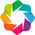

In [10]:
#Afin de mieux visualiser les boxplots, nous utiliserons les librairies holoviews et param 
import param
import panel as pn
import holoviews as hv
from holoviews import dim, opts
hv.extension('bokeh')
pn.extension()

En raison d'un grand nombre de sites et de l'hétérogénéité des valeurs, nous visualisons très mal les boxplots avec l'utilisation de panda. Ce pourquoi nous utiliserons holoviews. Ce qui nous servira aussi d'afficher les boxplots par variables 

In [11]:
#liste des variables quantitatives
var_list=data.columns[2:data.shape[1]].tolist()

In [12]:
def VisuBox(var):
    boxwhisker = hv.BoxWhisker(data, 'river', var).sort()
    return boxwhisker.opts(show_legend=False, xrotation = 90,width=1700, height =500)
    #return data.boxplot(var, "site_no", figsize=(30,8), rot=90)

In [13]:
class VisuBoxplot(param.Parameterized):
    variable = param.ObjectSelector(default='Q',objects=var_list)
    def view(self):
        Affich=VisuBox(self.variable)
        return Affich

In [14]:
Visuboxplot = VisuBoxplot()
pn.Column(Visuboxplot.param,Visuboxplot.view)

Column
    [0] Column(margin=5, name='VisuBoxplot', width=300)
        [0] StaticText(value='<b>VisuBoxplot</b>')
        [1] Select(name='Variable', options=OrderedDict([('flowacc', ...]), value='Q')
    [1] ParamMethod(method)

In [15]:
def VisuHist(var):
    frequencies, edges = np.histogram(data[var])
    hist = hv.Histogram((edges,frequencies))
    hist = hist.options(xlabel=var)
    return hist

In [16]:
class VisuHisto(param.Parameterized):
    variable = param.ObjectSelector(default='Q',objects=var_list)
    def view(self):
        Affich=VisuHist(self.variable)
        return Affich

In [17]:
Visuhisto = VisuHisto()
pn.Column(Visuhisto.param,Visuhisto.view)

Column
    [0] Column(margin=5, name='VisuHisto', width=300)
        [0] StaticText(value='<b>VisuHisto</b>')
        [1] Select(name='Variable', options=OrderedDict([('flowacc', ...]), value='Q')
    [1] ParamMethod(method)

Ici, on remarque que le mississipi présente des valeurs de débits bien supérieurs aux autres rivières, ce qui cause un écrasement du boxplot. De plus, on peut observer quelques données abérantes sur les boxplots des variables dA et dH notamment pour Kennebec. Afin de remédier ces problèmes nous allons supprimer de notre jeu de données les sites présentant de trop grosses valeurs de Q, dA et dH.

In [18]:
databis = data
databis = databis[databis['dH']<50]
databis

,site_no,river,flowacc,W,dH,dA,A0,Abar,Sdem,clay,...,LC4,LC5,LC6,LC7,LC8,LC9,LC10,LC11,LC12,Q
0,2419890,TALLAPOOSA,12033.084713,125.8824,0.999744,106.723296,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,76.172317
1,2419890,TALLAPOOSA,12033.084713,152.0952,8.382000,1048.567348,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,1486.634446
2,2419890,TALLAPOOSA,12033.084713,116.4336,0.743712,77.334349,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,46.156460
3,2419890,TALLAPOOSA,12033.084713,112.1664,2.225040,248.776690,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,150.645624
4,2419890,TALLAPOOSA,12033.084713,120.3960,1.645920,180.287175,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,140.168391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16632,5583000,SANGAMON,13190.809393,99.9744,0.835152,82.595448,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,78.720834
16633,5583000,SANGAMON,13190.809393,117.3480,3.133344,336.833006,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,396.435852
16634,5583000,SANGAMON,13190.809393,71.0184,0.344424,32.791986,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,32.564374
16635,5583000,SANGAMON,13190.809393,105.1560,1.770888,184.662899,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,190.572378


In [19]:
databis = databis[databis['dA']<10000]
databis

,site_no,river,flowacc,W,dH,dA,A0,Abar,Sdem,clay,...,LC4,LC5,LC6,LC7,LC8,LC9,LC10,LC11,LC12,Q
0,2419890,TALLAPOOSA,12033.084713,125.8824,0.999744,106.723296,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,76.172317
1,2419890,TALLAPOOSA,12033.084713,152.0952,8.382000,1048.567348,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,1486.634446
2,2419890,TALLAPOOSA,12033.084713,116.4336,0.743712,77.334349,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,46.156460
3,2419890,TALLAPOOSA,12033.084713,112.1664,2.225040,248.776690,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,150.645624
4,2419890,TALLAPOOSA,12033.084713,120.3960,1.645920,180.287175,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,140.168391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16632,5583000,SANGAMON,13190.809393,99.9744,0.835152,82.595448,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,78.720834
16633,5583000,SANGAMON,13190.809393,117.3480,3.133344,336.833006,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,396.435852
16634,5583000,SANGAMON,13190.809393,71.0184,0.344424,32.791986,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,32.564374
16635,5583000,SANGAMON,13190.809393,105.1560,1.770888,184.662899,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,190.572378


In [20]:
def VisuBoxBis(var):
    boxwhisker = hv.BoxWhisker(databis, 'river', var).sort()
    return boxwhisker.opts(show_legend=False, xrotation = 90,width=1700, height =500)

In [21]:
class VisuBoxplotBis(param.Parameterized):
    variable = param.ObjectSelector(default='Q',objects=var_list)
    def view(self):
        Affich=VisuBoxBis(self.variable)
        return Affich

In [22]:
Visuboxplotbis = VisuBoxplotBis()
pn.Column(Visuboxplotbis.param,Visuboxplotbis.view)

Column
    [0] Column(margin=5, name='VisuBoxplotBis', width=300)
        [0] StaticText(value='<b>VisuBoxplotBis</b>')
        [1] Select(name='Variable', options=OrderedDict([('flowacc', ...]), value='Q')
    [1] ParamMethod(method)

In [23]:
def VisuHistBis(var):
    frequencies, edges = np.histogram(databis[var])
    hist = hv.Histogram((edges,frequencies))
    hist = hist.options(xlabel=var)
    return hist

In [24]:
class VisuHistoBis(param.Parameterized):
    variable = param.ObjectSelector(default='Q',objects=var_list)
    def view(self):
        Affich=VisuHistBis(self.variable)
        return Affich

In [25]:
Visuhistobis = VisuHistoBis()
pn.Column(Visuhistobis.param,Visuhistobis.view)

Column
    [0] Column(margin=5, name='VisuHistoBis', width=300)
        [0] StaticText(value='<b>VisuHistoBis</b>')
        [1] Select(name='Variable', options=OrderedDict([('flowacc', ...]), value='Q')
    [1] ParamMethod(method)

Nous visualisons mieux les boxplots. Nous pouvons remarquer que les valeurs prises pour chaques variables sont assez hétérogènes d'une rivière à une autre, ce qui nous aménera à normaliser les données avant de faire une acp. A ce stade nous ne pouvons remarquer une similarité des boxplots par groupes de rivières.

In [26]:
datamap = datamap.iloc[databis.index,:]

Nous allons maintenant tenter de detecter lexistence de corrélations entreles variables

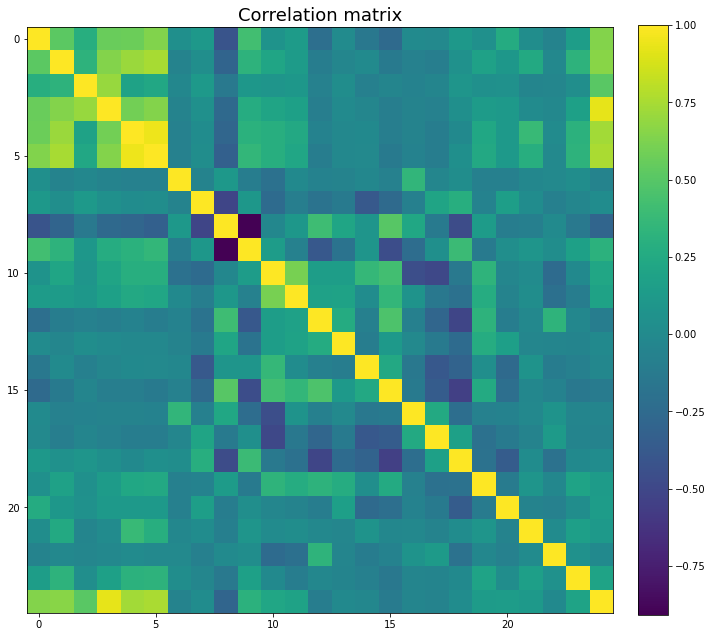

In [27]:
CM = np.corrcoef(pd.DataFrame(databis.iloc[:,2:]).fillna(0).T)

plt.figure(figsize = (10, 10))
plt.imshow(CM)

plt.title("Correlation matrix", fontsize = 18)
plt.colorbar(fraction = 0.046, pad = 0.04)

plt.tight_layout()
plt.show()

In [28]:
corr = databis.iloc[:,2:].corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)


,flowacc,W,dH,dA,A0,Abar,Sdem,clay,sand,silt,PA,TA,LC1,LC2,LC3,LC4,LC5,LC6,LC7,LC8,LC9,LC10,LC11,LC12,Q
flowacc,1.00,0.52,0.29,0.57,0.57,0.64,0.04,0.11,-0.42,0.43,0.07,0.14,-0.21,0.01,-0.14,-0.25,0.01,-0.01,0.11,0.05,0.26,0.02,-0.05,0.16,0.65
W,0.52,1.00,0.33,0.65,0.71,0.75,-0.06,0.03,-0.29,0.32,0.21,0.14,-0.10,-0.03,0.00,-0.13,-0.07,-0.09,0.05,0.19,0.10,0.25,-0.02,0.32,0.66
dH,0.29,0.33,1.00,0.70,0.19,0.24,-0.02,0.12,-0.14,0.10,0.09,0.10,-0.07,0.03,-0.08,-0.04,-0.06,-0.04,0.09,0.05,0.06,-0.04,-0.03,0.03,0.51
dA,0.57,0.65,0.70,1.00,0.59,0.65,-0.05,0.05,-0.26,0.27,0.21,0.18,-0.09,0.00,-0.03,-0.09,-0.06,-0.07,0.04,0.14,0.12,0.01,-0.02,0.18,0.93
A0,0.57,0.71,0.19,0.59,1.00,0.95,-0.07,0.02,-0.27,0.31,0.29,0.24,-0.06,-0.02,-0.00,-0.09,-0.05,-0.10,-0.01,0.23,0.12,0.38,0.01,0.32,0.73
Abar,0.64,0.75,0.24,0.65,0.95,1.00,-0.07,0.03,-0.32,0.36,0.29,0.22,-0.10,-0.01,-0.01,-0.13,-0.06,-0.10,0.04,0.24,0.12,0.29,-0.01,0.32,0.76
Sdem,0.04,-0.06,-0.02,-0.05,-0.07,-0.07,1.00,-0.06,0.11,-0.10,-0.19,-0.00,-0.07,-0.05,-0.02,-0.07,0.35,-0.03,0.03,-0.08,-0.08,-0.02,-0.01,0.02,-0.05
clay,0.11,0.03,0.12,0.05,0.02,0.03,-0.06,1.00,-0.51,0.10,-0.24,-0.09,-0.18,-0.13,-0.37,-0.25,-0.08,0.21,0.29,-0.06,0.16,0.02,-0.08,-0.03,0.02
sand,-0.42,-0.29,-0.14,-0.26,-0.27,-0.32,0.11,-0.51,1.00,-0.91,-0.03,0.10,0.41,0.21,0.08,0.50,0.23,-0.13,-0.46,0.14,-0.10,-0.09,0.01,-0.14,-0.29
silt,0.43,0.32,0.10,0.27,0.31,0.36,-0.10,0.10,-0.91,1.00,0.15,-0.07,-0.38,-0.18,0.08,-0.46,-0.23,0.04,0.39,-0.13,0.03,0.09,0.03,0.17,0.32


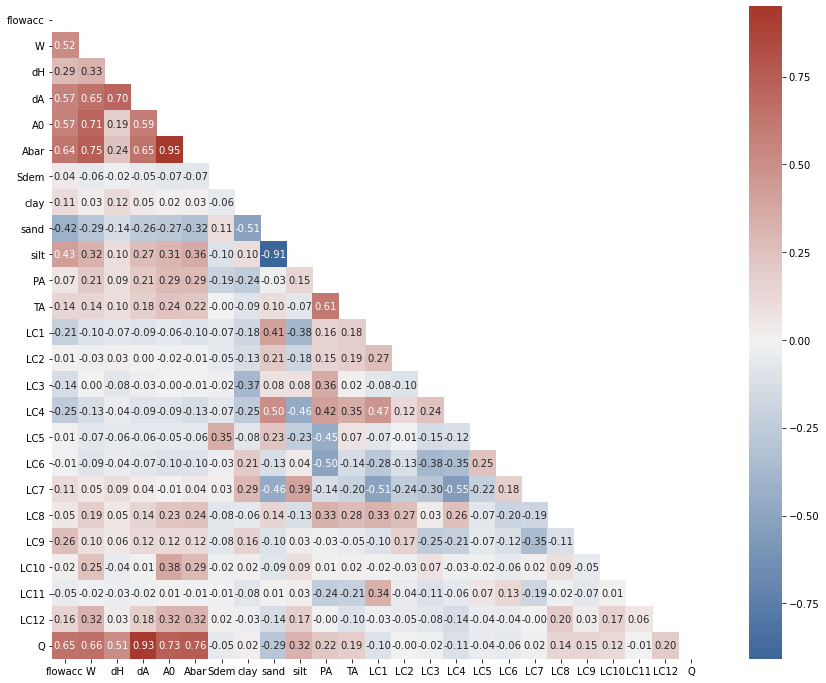

In [29]:
# Create a mask
mask = np.triu(np.ones_like(corr, dtype=bool))

# Create a custom diverging palette
cmap = sns.diverging_palette(250, 15, s=75, l=40,
                             n=9, center="light", as_cmap=True)

plt.figure(figsize=(16, 12))

test = sns.heatmap(corr, mask=mask, center=0, annot=True,
             fmt='.2f', square=True, cmap=cmap)

fig = test.get_figure()
fig.savefig('corr_Hydro.png')
plt.show();


In [30]:
correlation = np.where(np.abs(CM)>= 0.8)
correlation

(array([ 0,  1,  2,  3,  3,  4,  4,  5,  5,  6,  7,  8,  8,  9,  9, 10, 11,
        12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 24],
       dtype=int64),
 array([ 0,  1,  2,  3, 24,  4,  5,  4,  5,  6,  7,  8,  9,  8,  9, 10, 11,
        12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,  3, 24],
       dtype=int64))

In [31]:
n = len(correlation[0])

for i in range(n):
    if correlation[0][i]!=correlation[1][i]:
        a = databis.iloc[:,2:].columns[correlation[0][i]]
        b = databis.iloc[:,2:].columns[correlation[1][i]]
        print("la variable", a,"est corrélé avec la variable",b)

la variable dA est corrélé avec la variable Q
la variable A0 est corrélé avec la variable Abar
la variable Abar est corrélé avec la variable A0
la variable sand est corrélé avec la variable silt
la variable silt est corrélé avec la variable sand
la variable Q est corrélé avec la variable dA


Nous obtenons naturellement, que les variables dA et dH sont fortement corrélées ainsi que les vaiable sand et silt. Nous n'obtenons pas les même résultats avec les données de PepsiR

## Analyse en composantes principales

Nous avons pour le moment 26 variables explicatives, nous allons donc tenter de réduire le nombres de caractéristiques pouvant être determinant dans notre analyse via une acp classique.

In [32]:
databis

,site_no,river,flowacc,W,dH,dA,A0,Abar,Sdem,clay,...,LC4,LC5,LC6,LC7,LC8,LC9,LC10,LC11,LC12,Q
0,2419890,TALLAPOOSA,12033.084713,125.8824,0.999744,106.723296,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,76.172317
1,2419890,TALLAPOOSA,12033.084713,152.0952,8.382000,1048.567348,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,1486.634446
2,2419890,TALLAPOOSA,12033.084713,116.4336,0.743712,77.334349,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,46.156460
3,2419890,TALLAPOOSA,12033.084713,112.1664,2.225040,248.776690,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,150.645624
4,2419890,TALLAPOOSA,12033.084713,120.3960,1.645920,180.287175,100.144012,256.363762,0.000983,18.801653,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,140.168391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16632,5583000,SANGAMON,13190.809393,99.9744,0.835152,82.595448,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,78.720834
16633,5583000,SANGAMON,13190.809393,117.3480,3.133344,336.833006,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,396.435852
16634,5583000,SANGAMON,13190.809393,71.0184,0.344424,32.791986,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,32.564374
16635,5583000,SANGAMON,13190.809393,105.1560,1.770888,184.662899,45.354240,331.609634,0.000891,20.743802,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,190.572378


In [33]:
dataACP=databis.iloc[:,2:]
dataACP

,flowacc,W,dH,dA,A0,Abar,Sdem,clay,sand,silt,...,LC4,LC5,LC6,LC7,LC8,LC9,LC10,LC11,LC12,Q
0,12033.084713,125.8824,0.999744,106.723296,100.144012,256.363762,0.000983,18.801653,47.338843,33.834711,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,76.172317
1,12033.084713,152.0952,8.382000,1048.567348,100.144012,256.363762,0.000983,18.801653,47.338843,33.834711,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,1486.634446
2,12033.084713,116.4336,0.743712,77.334349,100.144012,256.363762,0.000983,18.801653,47.338843,33.834711,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,46.156460
3,12033.084713,112.1664,2.225040,248.776690,100.144012,256.363762,0.000983,18.801653,47.338843,33.834711,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,150.645624
4,12033.084713,120.3960,1.645920,180.287175,100.144012,256.363762,0.000983,18.801653,47.338843,33.834711,...,28.958678,1.256198,11.685950,36.950413,0.107438,5.958678,0.0,0.0,0.0,140.168391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16632,13190.809393,99.9744,0.835152,82.595448,45.354240,331.609634,0.000891,20.743802,37.619835,41.595041,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,78.720834
16633,13190.809393,117.3480,3.133344,336.833006,45.354240,331.609634,0.000891,20.743802,37.619835,41.595041,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,396.435852
16634,13190.809393,71.0184,0.344424,32.791986,45.354240,331.609634,0.000891,20.743802,37.619835,41.595041,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,32.564374
16635,13190.809393,105.1560,1.770888,184.662899,45.354240,331.609634,0.000891,20.743802,37.619835,41.595041,...,4.355372,0.000000,13.371901,80.636364,0.000000,0.000000,0.0,0.0,0.0,190.572378


In [34]:
#définition de la commande

pcaR = PCA()
Hydroswot = pd.DataFrame(scale(dataACP), index=databis.iloc[:,1],columns = dataACP.columns)
#composantes principales
C = pcaR.fit(Hydroswot).transform(Hydroswot)

In [35]:
C

array([[-1.54007189e+00,  1.81563255e+00, -5.22618994e-01, ...,
         1.49166508e-02, -5.34958542e-04,  1.00092726e-04],
       [-3.75811972e-01,  2.06646255e+00,  2.73849178e-02, ...,
        -1.46514198e-01, -1.22091217e-03,  3.91078554e-04],
       [-1.59174918e+00,  1.80436775e+00, -5.43494886e-01, ...,
         2.17372130e-02, -5.13910829e-04,  8.65356982e-05],
       ...,
       [-1.18273607e+00, -1.27312726e+00, -6.97345661e-01, ...,
         3.65703651e-02, -1.74159265e-03, -6.22727991e-05],
       [-9.33104869e-01, -1.21940651e+00, -5.90384645e-01, ...,
        -4.72556482e-04, -1.87443700e-03,  6.71626093e-06],
       [-1.20522934e+00, -1.27774478e+00, -7.08496321e-01, ...,
         3.90053687e-02, -1.71837482e-03, -6.96178170e-05]])

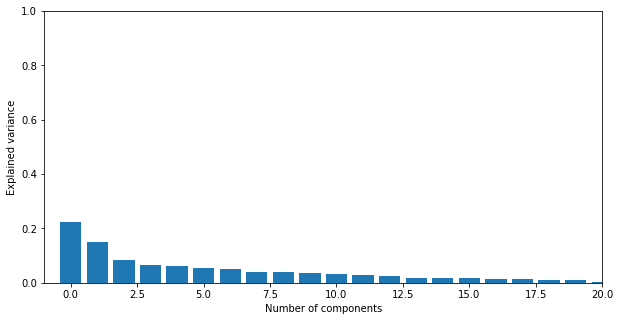

<Figure size 432x288 with 0 Axes>

In [36]:
plt.figure(figsize = (10,5))
x=np.arange(pcaR.explained_variance_ratio_.size)
plt.bar(x, pcaR.explained_variance_ratio_)
plt.axis((-1, 20, 0, 1))
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()
plt.savefig('test.png')

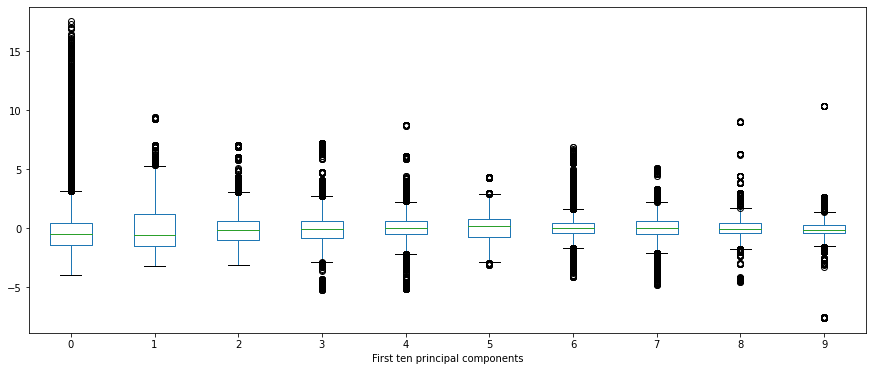

In [37]:
pd.DataFrame(C[:,0:10]).plot(kind = "box", figsize = (15, 6))#, showfliers=False )
plt.xlabel('First ten principal components')
plt.show()

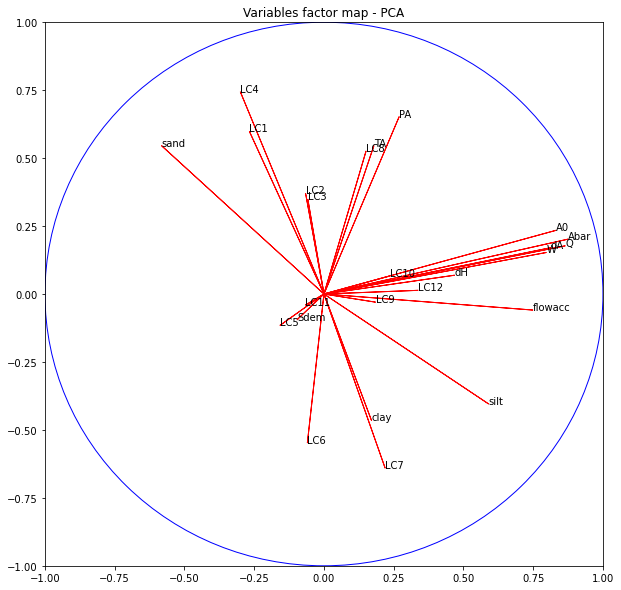

In [38]:
coord1 = pcaR.components_[0] * np.sqrt(pcaR.explained_variance_[0])
coord2 = pcaR.components_[1] * np.sqrt(pcaR.explained_variance_[1])
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, Hydroswot.columns):
    plt.text(i, j, nom)
    plt.arrow(0, 0, i, j, color = 'r', width = 0.0001)
plt.axis((-1, 1, -1, 1))
#Cercle
c = plt.Circle((0, 0), radius = 1, color = 'b', fill = False)
ax.add_patch(c)
plt.title('Variables factor map - PCA')
plt.show()

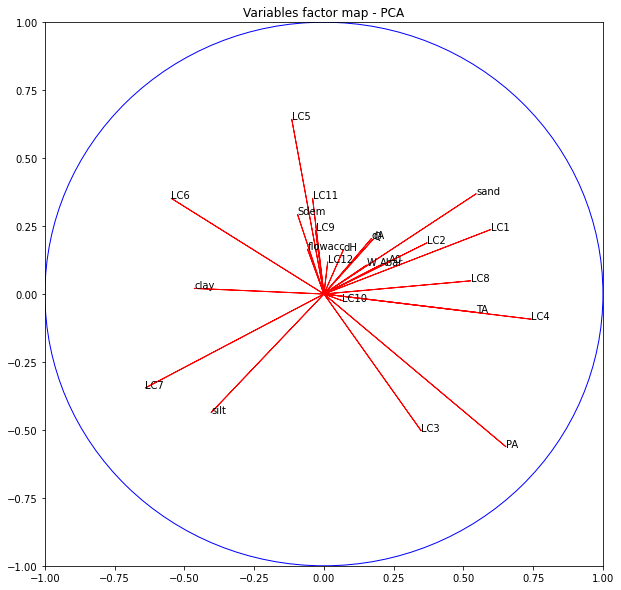

In [39]:
coord1 = pcaR.components_[1] * np.sqrt(pcaR.explained_variance_[1])
coord2 = pcaR.components_[2] * np.sqrt(pcaR.explained_variance_[2])
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, Hydroswot.columns):
    plt.text(i, j, nom)
    plt.arrow(0, 0, i, j, color = 'r', width = 0.0001)
plt.axis((-1, 1, -1, 1))
#Cercle
c = plt.Circle((0, 0), radius = 1, color = 'b', fill = False)
ax.add_patch(c)
plt.title('Variables factor map - PCA')
plt.show()

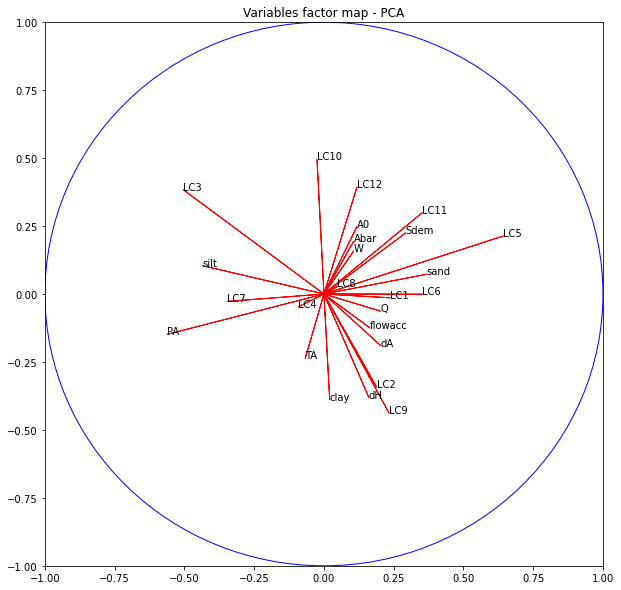

In [40]:
coord1 = pcaR.components_[2] * np.sqrt(pcaR.explained_variance_[2])
coord2 = pcaR.components_[3] * np.sqrt(pcaR.explained_variance_[3])
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1, coord2, Hydroswot.columns):
    plt.text(i, j, nom)
    plt.arrow(0, 0, i, j, color = 'r', width = 0.0001)
plt.axis((-1, 1, -1, 1))
#Cercle
c = plt.Circle((0, 0), radius = 1, color = 'b', fill = False)
ax.add_patch(c)
plt.title('Variables factor map - PCA')
plt.show()

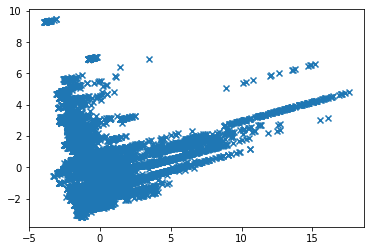

In [41]:
pc1 = C[:,0]
pc2 = C[:,1]
plt.scatter(pc1,pc2,marker="x")

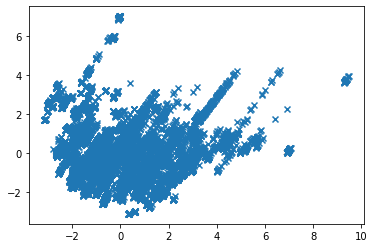

In [42]:
pc3 = C[:,2]
plt.scatter(pc2,pc3,marker="x")

## Application de techniques de clustering

### KMeans

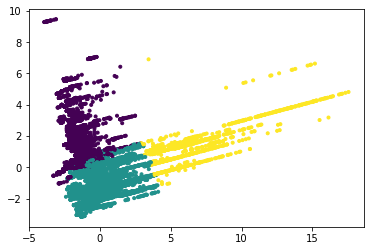

In [43]:
clust=KMeans(n_clusters=3)
clust.fit(Hydroswot)
classe=clust.labels_

plt.scatter(pc1, pc2, c=classe, marker='.') 
plt.savefig('Kmeans_acp_hydro.png')
plt.show()


In [44]:
HydroswotKM = Hydroswot.copy()
HydroswotKM['classe']=pd.Series(classe, index = HydroswotKM.index)

In [45]:
def ClasseRiver(river):
    resultat = True
    listeClasse = HydroswotKM[HydroswotKM.index== river].classe.value_counts().index
    nombreClasse = len(listeClasse)
    if nombreClasse != 1:
        resultat = False
    return resultat

In [46]:
HydroswotKM[HydroswotKM.classe== 0].index.unique()

Index(['TALLAPOOSA', 'ALABAMA', 'COOSA', 'CONECUH', 'MOBILE', 'SNAKE', 'WHITE',
       'ARK', 'TOMBIGBEE', 'COLORADO', 'ARKANSAS', 'SACRAMENTO', 'OCMULGEE',
       'ALTAMAHA', 'CHATTAHOOCHEE', 'SAVANNAH', 'LITTLE', 'SPOKANE',
       'SUWANNEE', 'PEND OREILLE', 'FLINT', 'CLARK FORK', 'KOOTENAI',
       'EAST FORK WHITE', 'OUACHITA', 'OHIO', 'CUMBERLAND', 'POTOMAC',
       'BAYOU ANACOCO', 'ST. JOHN', 'ANDROSCOGGIN', 'CALCASIEU', 'KENNEBEC',
       'PISCATAQUIS', 'PENOBSCOT', 'CONNECTICUT', 'RAINY', 'NAMAKAN',
       'MISSISSIPPI', 'MINNESOTA', 'YAZOO', 'BIG BLACK', 'GASCONADE', 'OSAGE',
       'YELLOWSTONE', 'MOHAWK', 'DELAWARE', 'CHEMUNG', 'HUDSON', 'CHENANGO',
       'SUSQUEHANNA', 'OSWEGO', 'GENESEE', 'CAPE FEAR', 'PEE DEE', 'MUSKINGUM',
       'POTEAU', 'DEEP FORK', 'ILLINOIS', 'WEST BRANCH SUSQUEHANNA',
       'WB SUSQUEHANNA', 'SCHUYLKILL', 'ALLEGHENY', 'YOUGHIOGHENY', 'JUNIATA',
       'CATAWBA', 'WATEREE', 'BROAD', 'CONGAREE', 'HIWASSEE', 'VILLAGE',
       'SULPHUR', 'FRENCH BRO

In [47]:
HydroswotKM[HydroswotKM.classe== 1].index.unique()

Index(['ARKANSAS', 'SNAKE', 'RED', 'BLACK', 'WHITE', 'SACRAMENTO',
       'SOUTH PLATTE', 'KOOTENAI', 'WABASH', 'CLEARWATER', 'WAPSIPINICON',
       'BEAVER', 'MISSISSIPPI', 'IOWA', 'DES MOINES', 'MISSOURI', 'CEDAR',
       'SOUTH SKUNK', 'SKUNK', 'BIG SIOUX', 'MAQUOKETA', 'POTTAWATOMIE',
       'KANSAS', 'NEOSHO', 'SPRING', 'VERDIGRIS', 'KENTUCKY', 'GREEN',
       'FLOODWAY AT ARKANSAS', 'OUACHITA', 'OHIO', 'MARMATON', 'POTOMAC',
       'AROOSTOOK', 'RED LAKE', 'MINNESOTA', 'ST. CROIX', 'OSAGE',
       'CLARK FORK', 'PLATTE', 'YELLOWSTONE', 'FLATHEAD', 'SOURIS', 'JAMES',
       'MUSKINGUM', 'GREAT MIAMI', 'G MIAMI', 'SCIOTO', 'POTEAU', 'WILLAMETTE',
       'CANADIAN', 'AUGLAIZE', 'MAUMEE', 'SUSQUEHANNA',
       'WEST BRANCH SUSQUEHANNA', 'YOUGHIOGHENY', 'LEHIGH', 'ALLEGHENY',
       'MONONGAHELA', 'TENNESSEE', 'CUMBERLAND', 'HARPETH', 'BRAZOS', 'LLANO',
       'MILL', 'S F SHENANDOAH', 'SHENANDOAH', 'NUECES', 'NEW', 'YAKIMA',
       'CHIPPEWA', 'FOX', 'CHELAN', 'WISCONSIN', 'ROCK', 'I

In [48]:
HydroswotKM[HydroswotKM.classe== 2].index.unique()

Index(['ARKANSAS', 'WABASH', 'MISSISSIPPI', 'DES MOINES', 'CEDAR', 'IOWA',
       'NEOSHO', 'VERDIGRIS', 'OHIO', 'ATCHAFALAYA', 'MISSOURI', 'SUSQUEHANNA',
       'TENNESSEE', 'VILLAGE', 'ILLINOIS'],
      dtype='object', name='river')

In [49]:
river_list = databis['river'].value_counts().index
river_list_diffclasse = []
for i in river_list:
    if ClasseRiver(i)==False:
        river_list_diffclasse.append(i)

In [50]:
river_list_diffclasse.sort()

In [51]:
river_list_diffclasse

['ALLEGHENY',
 'ARKANSAS',
 'BLACK',
 'BRAZOS',
 'CEDAR',
 'CHIPPEWA',
 'CLARK FORK',
 'CUMBERLAND',
 'DES MOINES',
 'GREEN',
 'ILLINOIS',
 'IOWA',
 'JAMES',
 'KOOTENAI',
 'MINNESOTA',
 'MISSISSIPPI',
 'MISSOURI',
 'MUSKINGUM',
 'NEOSHO',
 'NEW',
 'NUECES',
 'OHIO',
 'OSAGE',
 'OUACHITA',
 'POTEAU',
 'POTOMAC',
 'SACRAMENTO',
 'SHENANDOAH',
 'SNAKE',
 'SUSQUEHANNA',
 'TENNESSEE',
 'VERDIGRIS',
 'VILLAGE',
 'WABASH',
 'WEST BRANCH SUSQUEHANNA',
 'WHITE',
 'WISCONSIN',
 'YELLOWSTONE',
 'YOUGHIOGHENY']

In [52]:
print(len(HydroswotKM.index.unique()),'rivières')
print(len(river_list_diffclasse), 'sont dans différentes classes')
print(100*(len(river_list_diffclasse)/len(HydroswotKM.index.unique())),'% des rivières sont dans plusieurs classes')

141 rivières
39 sont dans différentes classes
27.659574468085108 % des rivières sont dans plusieurs classes


In [53]:
def VisuRiverClasse(var):
    x = np.where(HydroswotKM.index==var)
    c0 = np.where(HydroswotKM['classe']==0)
    c1 = np.where(HydroswotKM['classe']==1)
    c2 = np.where(HydroswotKM['classe']==2)
    points = (
    hv.Scatter((pc1[c0],pc2[c0]))*
    hv.Scatter((pc1[c1],pc2[c1]))*
    hv.Scatter((pc1[c2],pc2[c2]))*
    hv.Scatter((pc1[x],pc2[x]))
    )
    return points.opts(width=500, height =500)
    

class VisuRiver_Classe(param.Parameterized):
    variable = param.ObjectSelector(default='ALLEGHENY',objects=river_list_diffclasse)
    def view(self):
        Affich = VisuRiverClasse(self.variable)
        return Affich


In [54]:
Visuriverclasse = VisuRiver_Classe()
pn.Column(Visuriverclasse.param,Visuriverclasse.view)

Column
    [0] Column(margin=5, name='VisuRiver_Classe', width=300)
        [0] StaticText(value='<b>VisuRiver_Classe</b>')
        [1] Select(name='Variable', options=OrderedDict([('ALLEGHENY',...]), value='ALLEGHENY')
    [1] ParamMethod(method)

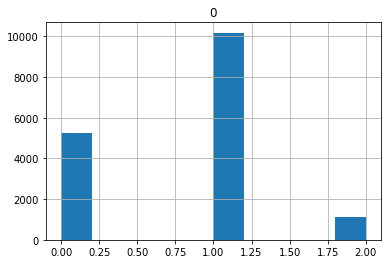

In [55]:
fig, ax = plt.subplots()
pd.DataFrame(classe).hist(ax=ax)
fig.savefig('Hist_Kmeans_hydro.png')


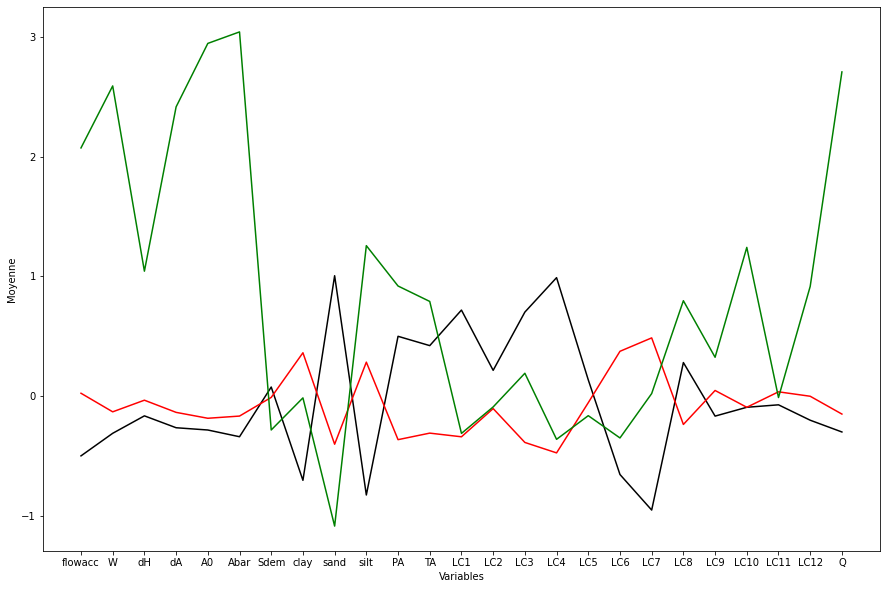

In [56]:
ncol = len(HydroswotKM.columns)
plt.figure(figsize = (15,10))
x = np.arange(0, ncol-1)
couleur = ['black', 'red', 'green']
for i in range(0,3):
    coul = couleur[i]
    y = np.mean(HydroswotKM.iloc[:,:-1][classe == i]) 
    plt.plot(x, y, coul) 
plt.ylabel('Moyenne')
plt.xlabel("Variables")
plt.xticks(np.arange(len(var_list)),labels=var_list)
plt.savefig('mean_variable_hydro.png')
plt.show()


In [57]:
hv.extension('matplotlib')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [58]:
Physical_var_Descriptor=['flowacc', 'Sdem', 'W', 'dA']
Physical_var=['flowacc', 'Sdem', 'W', 'dA','Q','A0']

In [59]:
def VisuRiverClasseV2(var1,var2,var3, river, Scale):
    if Scale:
        Hydroswot = pd.DataFrame(scale(dataACP), index=databis.iloc[:,1],columns = dataACP.columns)
    else:
        Hydroswot = dataACP.copy()
        Hydroswot.index=databis.iloc[:,1]
        
    var = [var1,var2,var3]
    clust = KMeans(n_clusters = 3)
    clust.fit(Hydroswot[Physical_var])
    classe = clust.labels_
    
    Hydroswot['classe']=pd.Series(classe, index = Hydroswot.index)
    
    x = np.where(Hydroswot.index==river)
    c0 = np.where(Hydroswot['classe']==0)
    c1 = np.where(Hydroswot['classe']==1)
    c2 = np.where(Hydroswot['classe']==2)
    
    HV1 = np.array(Hydroswot[var1])
    HV2 = np.array(Hydroswot[var2])
    HV3 = np.array(Hydroswot[var3])
    
    points = (
    hv.Scatter3D((HV1[c0],HV2[c0],HV3[c0]))*
    hv.Scatter3D((HV1[c1],HV2[c1],HV3[c1]))*
    hv.Scatter3D((HV1[c2],HV2[c2],HV3[c2]))*
    hv.Scatter3D((HV1[x],HV2[x],HV3[x]))
    )
    return points.opts(opts.Scatter3D(xlabel=var1,ylabel=var2,zlabel=var3))
    
class VisuRiver_ClasseV2(param.Parameterized):
    var1 = param.ObjectSelector(default='flowacc',objects=Physical_var)
    var2 = param.ObjectSelector(default='flowacc',objects=Physical_var)
    var3 = param.ObjectSelector(default='flowacc',objects=Physical_var)
    river = param.ObjectSelector(default=Hydroswot.index[0],objects=Hydroswot.index)
    scale = param.Boolean(default=True, doc='scale')
    def view(self):
        Affich = VisuRiverClasseV2(self.var1,self.var2,self.var3,self.river,self.scale)
        return Affich


Column
    [0] Column(margin=5, name='VisuRiver_ClasseV', width=300)
        [0] StaticText(value='<b>VisuRiver_ClasseV</b>'...)
        [1] Select(name='Var1', options=OrderedDict([('flowacc', ...]), value='flowacc')
        [2] Select(name='Var2', options=OrderedDict([('flowacc', ...]), value='flowacc')
        [3] Select(name='Var3', options=OrderedDict([('flowacc', ...]), value='flowacc')
        [4] Select(name='River', options=OrderedDict([('TALLAPOOSA'...]), value='TALLAPOOSA')
        [5] Checkbox(name='Scale', value=True)
    [1] ParamMethod(method)
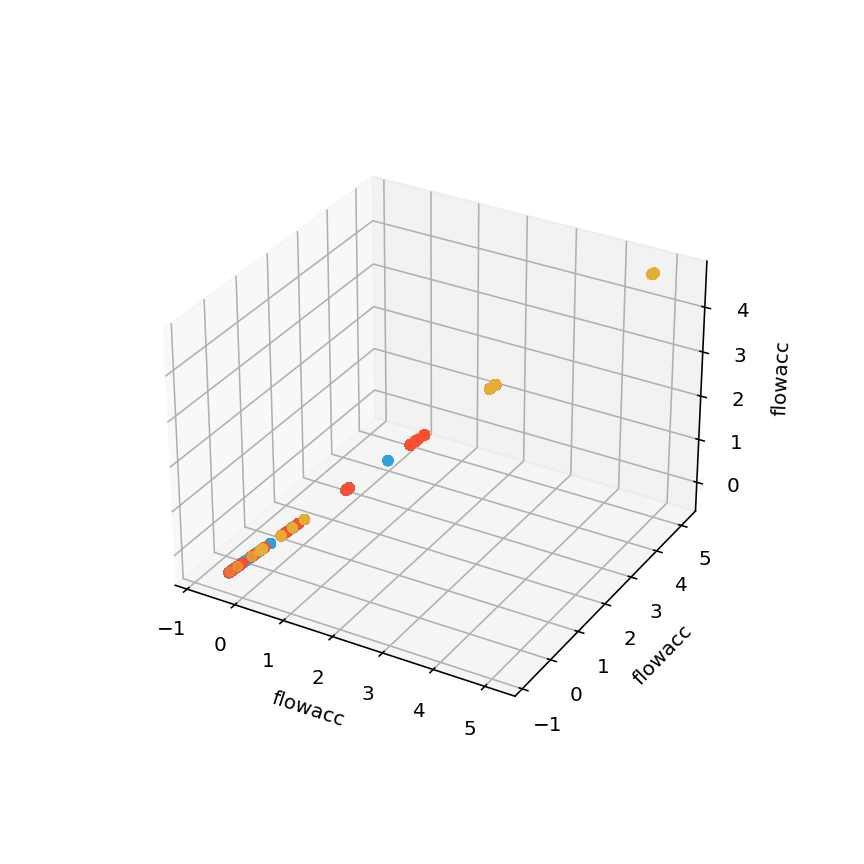

In [60]:
Visuriverclassev2 = VisuRiver_ClasseV2()
pn.Column(Visuriverclassev2.param,Visuriverclassev2.view)

In [61]:
import plotly.express as px
from ipywidgets import widgets
import plotly.graph_objects as go

In [62]:
def VisuMan(Scale, var1,var2,var3):
    if Scale:
        Hydroswot = pd.DataFrame(scale(dataACP), index=databis.iloc[:,1],columns = dataACP.columns)
    else:
        Hydroswot = dataACP.copy()
        Hydroswot.index=databis.iloc[:,1]
        
    var = [var1,var2,var3]
    clust = KMeans(n_clusters = 3)
    clust.fit(Hydroswot[Physical_var_Descriptor])
    classe = clust.labels_
    
    Hydroswot['classe']=pd.Series(classe, index = Hydroswot.index)

    fig = px.scatter_3d(Hydroswot, x=var1, y=var2, z=var3,
              color='classe')
   
    return fig

In [63]:
VisuMan(True, 'Sdem', 'flowacc', 'W')

In [64]:
var1 = widgets.Dropdown(
    options=Physical_var,
    value='flowacc',
    description='var1',
)

var2 = widgets.Dropdown(
    options=Physical_var,
    value='flowacc',
    description='var2',
)

var3 = widgets.Dropdown(
    options=Physical_var,
    value='flowacc',
    description='var3',
)

container = widgets.HBox(children=[var1, var2, var3])

Scale = widgets.Checkbox(
    description='Scale: ',
    value=False,
)


trace1 = go.Scatter3d(
    x=HydroswotKM['Sdem'],
    y=HydroswotKM['Q'],
    z=HydroswotKM['dA'],
    mode='markers',
    marker=dict(
        size=8,
        color=HydroswotKM['classe'],   
    )
)

trace2 = go.Scatter(
    x=HydroswotKM['Q'],
    y=HydroswotKM['A0'],
    mode='markers',
    marker=dict(size=8,color=HydroswotKM['classe'])
)

g = go.FigureWidget(data=trace1,
                    layout=go.Layout(
                        title=dict(
                            text='Visualition Kmeans données Hydroswot'
                        ),
                        barmode='overlay'
                    ))

g2 = go.FigureWidget(data=trace2,
                    layout=go.Layout(
                        title=dict(
                            text='A0 is plotted against Q'
                        ),
                        barmode='overlay'
                    ))

In [65]:
def validate():
    if var1.value in Physical_var and var2.value in Physical_var and var3.value in Physical_var:
        return True
    else:
        return False
    
def response(change):
    if validate():
        if Scale.value:
            Hydroswot = pd.DataFrame(scale(dataACP), index=databis.iloc[:,1],columns = dataACP.columns)
        else:
            Hydroswot = dataACP.copy()
            Hydroswot.index=databis.iloc[:,1]
            
        var = [var1.value,var2.value,var3.value]
        clust = KMeans(n_clusters = 3)
        clust.fit(Hydroswot[Physical_var_Descriptor])
        classe = clust.labels_
    
        Hydroswot['classe']=pd.Series(classe, index = Hydroswot.index)

        with g.batch_update():
            g.data[0].x = Hydroswot[var1.value]
            g.data[0].y = Hydroswot[var2.value]
            g.data[0].z = Hydroswot[var3.value]
            g.data[0].marker['color'] = Hydroswot['classe']
            g2.data[0].x = Hydroswot['Q']
            g2.data[0].y = Hydroswot['A0']
            g2.data[0].marker['color'] = Hydroswot['classe']
            
            
var1.observe(response, names="value")
var2.observe(response, names="value")
var3.observe(response, names="value")
Scale.observe(response, names="value")

In [66]:
container2 = widgets.HBox([Scale])
graphes = widgets.HBox([g,g2])
widgets.VBox([container,container2,graphes])

En ne considérant que les variables physiques dans le KMeans (flowacc,dA, Sdem et W) et en ne normalisant pas, le critère de divions de classe est entièrement porté par la variable flowacc qui présente les valeurs les plus grandes. Ainsi nous pouvons constituer une classe avec flowacc>1.5M, flowacc<520K et entre les deux.

En normalisant les données il est plus difficile de détecter 3 classes vraiment distinctes. Une classe se détache en considérant la variable Sdem. tandis que les 2 autres sont plus mélangé et pourrait être séparer par rapport à la variable W avec bcp d'imprécision.

In [67]:
fig = go.Figure(data=go.Scattergeo(
        lon = datamap['lon'],
        lat = datamap['lat'],
        mode = 'markers',
        marker_color = HydroswotKM['classe'],

        ))

fig.update_geos(visible=True,resolution=50,showrivers=True, rivercolor="Blue")

fig.update_layout(
        #title = 'Rivers',
        geo_scope='usa',
    )
fig.show()

In [68]:
datamap['lon'].unique()

array([ -86.19,  -86.4 ,  -86.36,  -87.55,  -87.06,  -88.02,  -92.73,
       -116.98, -116.69,  -94.04,  -92.3 ,  -92.14,  -94.29,  -93.14,
        -90.97,  -88.12, -111.58, -114.57,  -91.44,  -92.35,  -91.09,
        -91.64, -122.44, -121.59, -122.18, -103.8 ,  -83.27,  -82.67,
        -82.51,  -83.72,  -85.09,  -81.5 ,  -83.45, -116.79,  -82.56,
       -117.03, -112.05,  -84.01, -116.5 , -116.07,  -85.04,  -85.1 ,
        -84.99, -115.09, -114.9 , -116.04,  -87.56,  -87.53,  -87.41,
       -113.5 , -114.47, -111.66, -112.87,  -87.42,  -87.37,  -86.89,
       -117.07, -116.25, -116.82,  -87.94,  -86.2 , -115.98, -116.42,
        -86.18,  -87.25,  -87.28,  -90.53,  -90.19,  -90.25,  -86.79,
        -92.06,  -91.17,  -86.37,  -92.97,  -92.86,  -92.41,  -91.95,
        -93.6 ,  -93.33,  -95.92,  -93.99,  -93.66,  -93.62,  -91.66,
        -96.24,  -96.41,  -91.47,  -93.59,  -91.29,  -91.06,  -91.18,
        -91.27,  -91.78,  -92.02,  -92.47,  -93.24,  -92.44,  -93.27,
        -91.71,  -96